# 3D plots

In [1]:
import numpy as np
import pandas as pd
import sklearn

import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d
from matplotlib import cm
%matplotlib inline

import plotly
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode()

If you got the this warrning:
**IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.** 

you may restart your jupyther with the following command:
**jupyter  notebook --NotebookApp.iopub_data_rate_limit=100000000**

With the help of this command you set the data rate limit to your notebook server.

## Matplotlib 3D plot

#### Random 3D points visualization

In [1]:
def randrange(n, vmin, vmax):
    '''
    Helper function to make an array of random numbers having shape (n, )
    with each number distributed Uniform(vmin, vmax).
    '''
    return (vmax - vmin)*np.random.rand(n) + vmin

In [5]:
n = 100
xs = randrange(n, 23, 32)
ys = randrange(n, 0, 100)
zs = randrange(n, 0, 7)

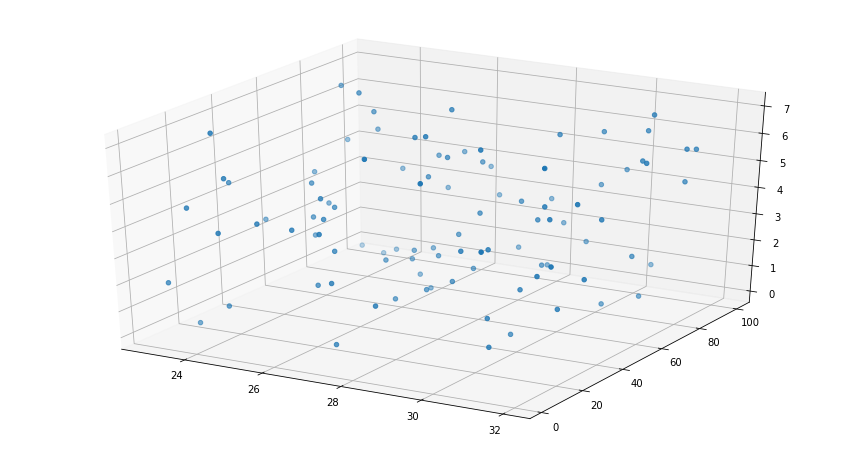

In [6]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs, ys, zs)
plt.show()

#### Matplotlib test dataset visualization

In [8]:
X, Y, Z = axes3d.get_test_data(0.05)

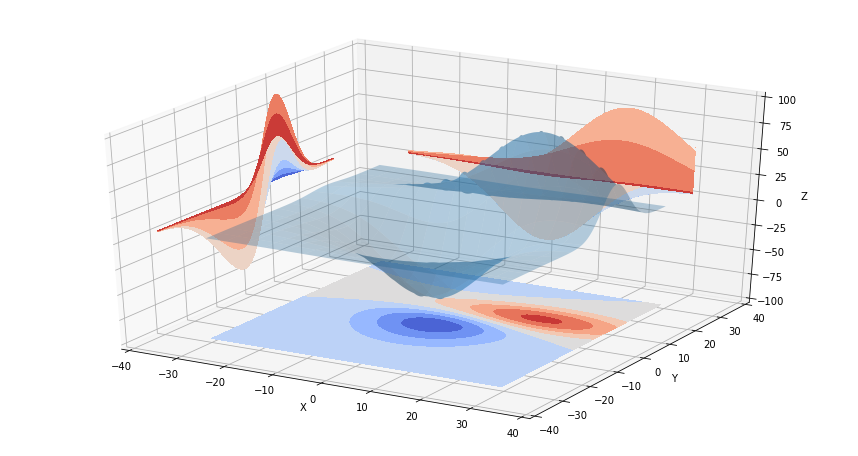

In [12]:
fig = plt.figure(figsize=(15, 8))
ax = fig.gca(projection='3d')

ax.plot_surface(X, Y, Z, rstride=8, cstride=8, alpha=0.3)
cset = ax.contourf(X, Y, Z, zdir='z', offset=-100, cmap=cm.coolwarm)
cset = ax.contourf(X, Y, Z, zdir='x', offset=-40, cmap=cm.coolwarm)
cset = ax.contourf(X, Y, Z, zdir='y', offset=40, cmap=cm.coolwarm)

ax.set_xlabel('X')
ax.set_xlim(-40, 40)
ax.set_ylabel('Y')
ax.set_ylim(-40, 40)
ax.set_zlabel('Z')
ax.set_zlim(-100, 100)

plt.show()

## Plotly 3D plot

In [2]:
s = np.linspace(0, 2 * np.pi, 240)
t = np.linspace(0, np.pi, 240)
tGrid, sGrid = np.meshgrid(s, t)

r = 3 + np.sin(3 * sGrid + 9 * tGrid)  # r = 2 + sin(3s+9t)
x = r * np.cos(sGrid) * np.sin(tGrid)  # x = r*cos(s)*sin(t)
y = r * np.sin(sGrid) * np.sin(tGrid)  # y = r*sin(s)*sin(t)
z = r * np.cos(tGrid)                  # z = r*cos(t)

In [3]:
surface = go.Surface(x=x, y=y, z=z, colorscale='Viridis')

In [4]:
layout = go.Layout(
    autosize=False,
    width=800,
    height=800,
    title='Parametric Plot',
    scene=dict(
        xaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        yaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        zaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        )
    )
)

In [8]:
fig = go.Figure(data=[surface], layout=layout)

In [6]:
py.iplot(fig, filename='Parametric_plot')